# Baseline

## Préparation des données

Nous allons reprendre les codes utilisés lors du Projet 5 afin d'obtenir une baseline à comparer avec nos nouvelles approches. La première étape est d'importer les données dont nous aurons besoin.

In [1]:
import pandas as pd
#On importe le jeu de données
data = pd.read_csv('QueryResults.csv')
#On affiche sa taille et les noms des colonnes
print(data.shape)
print(data.columns)

data.head()

(27128, 8)
Index(['Title', 'Body', 'Tags', 'Id', 'Score', 'ViewCount', 'FavoriteCount',
       'AnswerCount'],
      dtype='object')


,Title,Body,Tags,Id,Score,ViewCount,FavoriteCount,AnswerCount
0,Mercator longitude and latitude calculations t...,<p>I have this image. It's a map of the UK (no...,<javascript><geolocation><projection><processi...,2103924,19,30199,29,10
1,Starting point for learning CAD/CAE file formats?,<p>We are developing some stress and strain an...,<c++><file-format><autocad><cad><solid-bodies>,1024323,6,6097,11,6
2,LINQ query on a DataTable,<p>I'm trying to perform a LINQ query on a Dat...,<c#><.net><linq><datatable><.net-3.5>,10855,1107,1042939,215,22
3,How to overload std::swap(),<p><code>std::swap()</code> is used by many st...,<c++><performance><optimization><stl><c++-faq>,11562,122,34718,50,4
4,How do you get a directory listing in C?,<p>How do you scan a directory for folders and...,<c><file><directory><cross-platform><common-ta...,12489,65,136135,21,9


In [2]:
#On supprime les colonnes qui ne nous intéresseront pas
data.drop(columns = ['Id', 'Score', 'ViewCount', 'FavoriteCount', 'AnswerCount'], inplace = True)

data.head()

,Title,Body,Tags
0,Mercator longitude and latitude calculations t...,<p>I have this image. It's a map of the UK (no...,<javascript><geolocation><projection><processi...
1,Starting point for learning CAD/CAE file formats?,<p>We are developing some stress and strain an...,<c++><file-format><autocad><cad><solid-bodies>
2,LINQ query on a DataTable,<p>I'm trying to perform a LINQ query on a Dat...,<c#><.net><linq><datatable><.net-3.5>
3,How to overload std::swap(),<p><code>std::swap()</code> is used by many st...,<c++><performance><optimization><stl><c++-faq>
4,How do you get a directory listing in C?,<p>How do you scan a directory for folders and...,<c><file><directory><cross-platform><common-ta...


Nous allons formater les textes **avec les mêmes fonctions** que lors de notre première approche de ce jeu de données, afin de conserver une baseline aussi fidèle que possible à ce que nous avions obtenu. Néanmoins les fonctions suivantes pourraient facilement être remplacées par de simples recherches d'expressions régulières.

In [3]:
#On va formater nos textes en ôtant les balises. Pour certaines d'entre elles (listées dans "bal_suppr")
#il faudra aussi supprimer le contenu ENTRE les balises (par exemple les bouts de code ou les insertions d'images)
def formatage_texte(texte, bal_suppr):
    #On cherche une première balise
    temp = texte.find('<')
    n = len(texte)
    while temp >= 0:
        #On identifie la balise en cherchant le premier espace ou chevron fermant
        end1 = texte.find('>', temp+1, n)
        end2 = texte.find(' ', temp+1, n)
        candidat = texte[temp+1:min_modif(end1, end2, n)]
        #On initialise le point où redémarrer
        restart = temp+1
        #On vérifie qu'il s'agisse bien d'une balise
        if end1 > 0:
            #Si la balise est dans "balise_suppr"...
            if (candidat in bal_suppr):
                #... on cherche la balise fermante associée
                temp_close = texte.find('</'+candidat, end1+1, n)
                temp_end = texte.find('>', temp_close+1, n)
                #On supprime du texte les deux balises et ce qui se trouvait entre elles
                if temp_end < n:
                    texte = texte[:temp] + texte[temp_end+1:]
                #Si la balise fermante est tout a la fin on n'a pas de second morceau dans l'opération
                else:
                    texte = texte[:temp]
            #Sinon c'est une balise simple (ouvrante ou fermante, qu'importe)
            else :
                #On supprime la balise du texte étudié
                if end1 < n:
                    texte = texte[:temp] + texte[end1+1:]
                #Si la balise est tout a la fin on n'a pas de second morceau dans l'opération
                else:
                    texte = texte[:temp]
            
            #On met à jour la longueur du texte et le redémarrage après suppression
            n = len(texte)
            restart = temp
        #On cherche la balise suivante
        temp = texte.find('<', restart, n)
    return texte

#La fonction "find" pouvant renvoyer -1 il faut adapter la fonction "min" à ces cas particuliers
#en faisant comme si ce -1 valait plus que n, la longueur maximale possible dans ce contexte
def min_modif(a,b,n):
    if a < 0:
        if b < 0:
            return n
        else:
            return b
    elif b < 0:
        return a
    else:
        return min(a,b)

In [4]:
import string
import re

#On liste les balises dont on souhaite supprimer le contenu
balises_supprimer = ['a', 'pre', 'code']
#On applique la fonction aux titres et aux corps
Title_formated = data['Title'].apply(lambda x : formatage_texte(x, balises_supprimer))
Body_formated = data['Body'].apply(lambda x : formatage_texte(x, balises_supprimer))
#On concatène le titre et le corps formatés pour avoir un unique texte en anglais
data['Texte'] = Title_formated + '\n' + Body_formated
#On supprime les colonnes obsolètes
data.drop(columns=['Title', 'Body'], inplace=True)
#On supprime les nombres ainsi que les espacements multiples
data['Texte'].replace(r'\d+', '', regex=True, inplace=True)
data['Texte'].replace(rf"[{re.escape(string.whitespace)}]+", ' ', regex=True, inplace=True)
#On supprime les signes de ponctuation, en isolant le caractère ' (puisqu'utilisé pour délimiter le pattern recherché) 
data['Texte'] = data['Texte'].replace(r'[.,!?:;-=..."@#_()]', '', regex=True)
data['Texte'].replace(r"'", '', regex=True, inplace=True)
#On remplace les majuscules par leurs versions minuscules
data['Texte'] = data['Texte'].apply(lambda x : x.lower())

data.head()

,Tags,Texte
0,<javascript><geolocation><projection><processi...,mercator longitude and latitude calculations t...
1,<c++><file-format><autocad><cad><solid-bodies>,starting point for learning cad/cae file forma...
2,<c#><.net><linq><datatable><.net-3.5>,linq query on a datatable im trying to perform...
3,<c++><performance><optimization><stl><c++-faq>,how to overload stdswap is used by many std co...
4,<c><file><directory><cross-platform><common-ta...,how do you get a directory listing in c how do...


Nous allons lemmatiser nos textes, toujours avec l'ancienne approche et les fonctions que nous avions mises en place.

In [5]:
#Une fonction permettant de retirer les mots présents dans une liste de stopwords donnée en paramètres
def remove_stopwords(texte, stop):
    words = texte.split(' ')
    noise_free_words = [word for word in words if word not in stop] 
    return " ".join(noise_free_words)

#Une fonction qui utilisera le lemmatiseur donné en paramètres pour transofrmer et filtrer les mots dans nos textes
def lemmatizer_noms(texte, nlp, types_retenus=[]):  
    #On lemmatise le texte
    temp = nlp(texte)
    #Par défaut on retient tous les mots obtenus
    if types_retenus == []:
        result = [mot.lemma_ for mot in temp if len(mot.lemma_) > 1]
    #Sinon on ajoute un tri sur la nature du mot
    else :
        result = [mot.lemma_ for mot in temp if (len(mot.lemma_) > 1 and mot.pos_ in types_retenus)]
        #S'il n'y a aucun mot conservé par notre traitement, on renvoie une phrase "NONE"
        if result == []:
            result = ['NONE']
    #On renvoie la liste de mots lemmatisés
    return ' '.join(result)

In [6]:
#Traitement de textes
import nltk
from nltk.corpus import stopwords
import spacy

#On utilisera les stopwords de nltk
nltk.download('stopwords')
stop = set(stopwords.words('english'))
#On utilisera le lemmatiseur de spacy
nlp = spacy.load('en_core_web_sm')
#On retiendra les noms et noms propres
types_retenus = ['NOUN', 'PROPN', 'VER']
#On applique nos fonctions précédemment codées pour transformer notre texte
data['Texte'] = data['Texte'].apply(lambda x: remove_stopwords(x, stop))
data['Texte'] = data['Texte'].apply(lambda x: lemmatizer_noms(x, nlp, types_retenus))

data.head()

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\monte\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


,Tags,Texte
0,<javascript><geolocation><projection><processi...,mercator longitude latitude calculation map uk...
1,<c++><file-format><autocad><cad><solid-bodies>,point cad cae file stress analysis software un...
2,<c#><.net><linq><datatable><.net-3.5>,linq query datatable linq query object query e...
3,<c++><performance><optimization><stl><c++-faq>,overload stdswap container assignment implemen...
4,<c><file><directory><cross-platform><common-ta...,directory scan directory folder file cross pla...


## Analyse des données

On analyse nos données formatées, en particulier quels sont les **mots les plus fréquents**. On utilisera à nouveau les méthodes mises en place lors du Projet 5.

In [7]:
from sklearn.feature_extraction.text import CountVectorizer

#On initialise les deux vectorizers
bow_vect = CountVectorizer(stop_words='english', max_df=0.95, min_df=1)

#On indique quelle colonne contient les phrases a traiter
col_phrases = 'Texte'

#On va supprimer les documents qui n'ont plus de textes à traiter à cause du POS tagging
data_temp = data.dropna(axis=0, subset=col_phrases)

#On fit + transform les deux vectorizers au jeu de train
bow_transform = bow_vect.fit_transform(data_temp[col_phrases])  

#On formate les résultats en sparse DataFrame (pour économiser l'espace mémoire)
df_bow_sparse = pd.DataFrame.sparse.from_spmatrix(bow_transform, index=data_temp.index,
                                                  columns=bow_vect.get_feature_names_out())

In [8]:
import seaborn as sns
import matplotlib.pyplot as plt

#Petite fonction d'affichage des mots les plus fréquents, empruntée à internet
def word_frequency_barplot(df, nr_top_words=50):
    fig, ax = plt.subplots(1,1,figsize=(20,5))
    
    #Notons que la fonction trie le dataframe !
    df.sort_values(ascending=False, inplace = True)
    sns.barplot(list(range(nr_top_words)), df.values[:nr_top_words], palette='hls', ax=ax)

    ax.set_xticks(list(range(nr_top_words)))
    ax.set_xticklabels(df.index[:nr_top_words], fontsize=14, rotation=90)
    return ax

D:\Anaconda\envs\IML\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


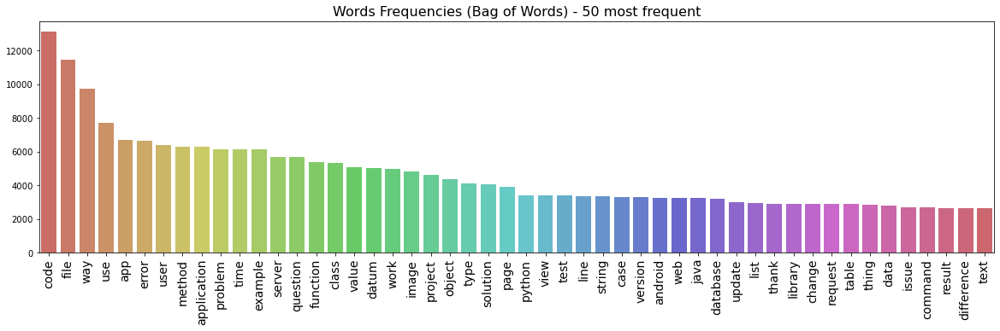

In [9]:
#On va compter les occurences en sommant les apparitions de chaque mot dans TOUS les documents du corpus
count_bow = df_bow_sparse.sum()
#Puis faire appel à notre fonction d'affichage pour représenter le résultat obtenu
ax = word_frequency_barplot(count_bow)
ax.set_title("Words Frequencies (Bag of Words) - 50 most frequent", fontsize=16);

On visualise les données en réduisant à 2 dimensions grâce à un **t-SNE**.

In [10]:
from scipy import sparse
from sklearn import preprocessing

#On va utiliser les formats de données sparse car sinon le dataframe est trop gros pour être manipulable
X_sparse = sparse.csr_matrix(df_bow_sparse)
#Réduction de nos données (pas de centrage, car non nécessaire)
X_scaled = preprocessing.StandardScaler(with_mean=False).fit_transform(X_sparse)

In [11]:
import matplotlib.pyplot as plt
from sklearn import manifold

#Réduction à 2 dimensions via t-SNE pour visualisation : on cherche d'éventuels" "clusters évidents"
X_embedded = manifold.TSNE(n_components=2, learning_rate='auto', init='random').fit_transform(X_scaled)

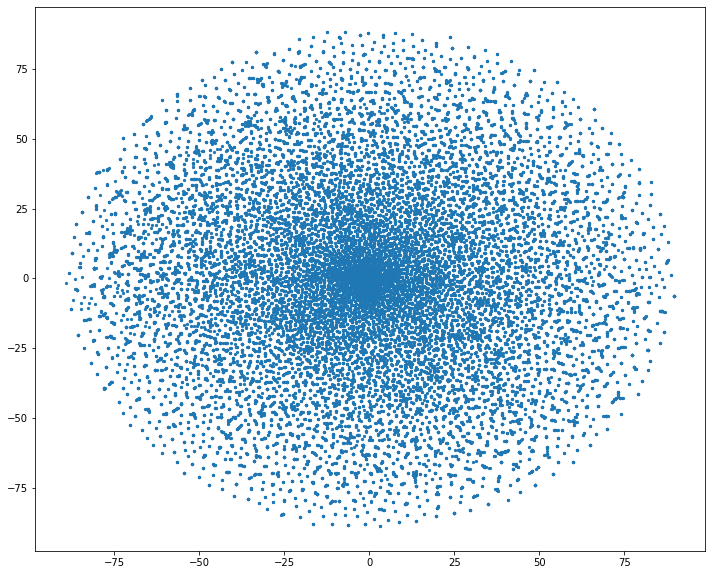

In [12]:
#On affiche les résultats
plt.figure(figsize=(12,10))
plt.scatter(X_embedded[:,0], X_embedded[:,1], s=5)
plt.show()

On va réaliser un **Wordcloud** pour faire ressortir l'importance des mots les plus fréquents.

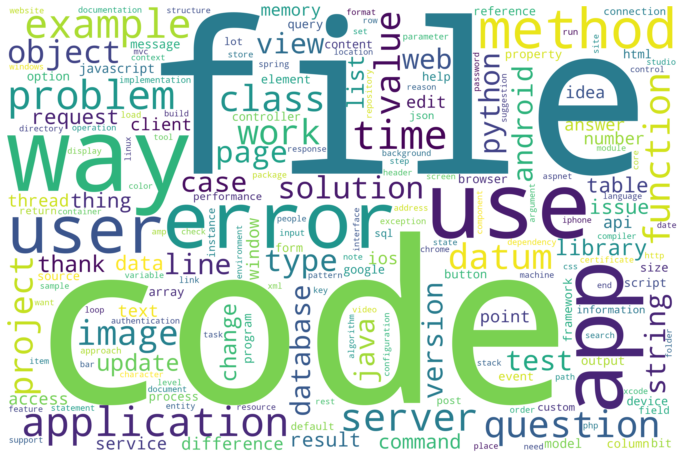

In [13]:
from wordcloud import WordCloud
from wordcloud import STOPWORDS

#On initialise le WordCloud
wordcloud = WordCloud(width = 3000, height = 2000, background_color='white', stopwords=STOPWORDS)
#On liste les fréquences d'apparition de chaque mot
counter = df_bow_sparse.sum(axis = 0)
#On génère le wordcloud à partir de ces fréquences
wordcloud.generate_from_frequencies(counter)
#On affiche le wordcloud obtenu
plt.figure(figsize=(12, 12))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

## Détection des sujets par LDA

A présent on applique une **LDA** à nos données, après la tokenisation adéquate. On pensera à chronométrer le temps de calcul de lm'algorithme, pour comparer avec les nouvelles approches.

In [14]:
import gensim
import gensim.corpora as corpora
import timeit

#On prépare nos textes
textes = data["Texte"].apply(lambda x: x.split(' '))
id2word = corpora.Dictionary(textes)
#On génère le corpus
corpus = []
for text in textes:
    new = id2word.doc2bow(text)
    corpus.append(new)
#On applique le modèle LDA, en chronométrant
start_time = timeit.default_timer()
lda = gensim.models.ldamodel.LdaModel(corpus=corpus, id2word=id2word, num_topics=30, random_state=42,
                                           update_every=1, chunksize=100, passes=10, alpha='auto')
elapsed = timeit.default_timer() - start_time

print("Temps de calcul : {}".format(elapsed))
for idx, topic in lda.print_topics(-1):
    print('Topic: {} \nWords: {}'.format(idx, topic))

Temps de calcul : 440.34716749999984
Topic: 0 
Words: 0.159*"google" + 0.117*"name" + 0.110*"javascript" + 0.103*"browser" + 0.098*"html" + 0.090*"property" + 0.064*"css" + 0.034*"tab" + 0.033*"character" + 0.025*"bash"
Topic: 1 
Words: 0.166*"android" + 0.154*"page" + 0.080*"link" + 0.067*"content" + 0.058*"element" + 0.053*"load" + 0.037*"check" + 0.032*"here" + 0.030*"effect" + 0.030*"figure"
Topic: 2 
Words: 0.212*"error" + 0.123*"project" + 0.114*"server" + 0.096*"version" + 0.080*"issue" + 0.043*"component" + 0.037*"parameter" + 0.037*"part" + 0.035*"studio" + 0.033*"build"
Topic: 3 
Words: 0.219*"function" + 0.120*"change" + 0.101*"output" + 0.098*"result" + 0.080*"call" + 0.075*"process" + 0.051*"rest" + 0.043*"state" + 0.033*"want" + 0.028*"behavior"
Topic: 4 
Words: 0.430*"view" + 0.207*"query" + 0.131*"sql" + 0.030*"person" + 0.016*"oracle" + 0.010*"linq" + 0.000*"immediate" + 0.000*"scngeometry" + 0.000*"rzwsgi" + 0.000*"practical"
Topic: 5 
Words: 0.157*"datum" + 0.150*"py

On peut identifier dans l'ordre les sujets suivants : 0 - "développement web", 1 - "android", 2 - "serveur", 3 - "fonctions", 4 - "sql", 5 - "python", 6 - "algorithme", 7 - "image", 8 - "app", 9 - "web", 10 - "sécurité", 11 - "session", 12 - "point", 13 - "java", 14 - "orienté objet", 15 - "people", 16 - "base de données", 17 - "api", 18 - "outils", 19 - "dossiers", 20 - "fichiers", 21 - "github", 22 - "méthode", 23 - "c++", 24 - "spring", 25 - "texte", 26 - "smartphone", 27 - "utilisateur", 28 - "temps et dates", 29 - "code".

Nous allons visualiser les résultats de notre LDA avec **pyLDAvis**.

In [15]:
import pyLDAvis
import pyLDAvis.gensim_models

pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(lda, corpus, id2word, mds="mmds", R=30)
vis

C:\Users\monte\AppData\Roaming\Python\Python39\site-packages\pyLDAvis\_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
29    -0.532499  0.129608       1        1  17.953914
2      0.200460 -0.488455       2        1   6.611354
5      0.461744  0.205728       3        1   4.832118
19     0.335509  0.341650       4        1   4.534327
20     0.473450 -0.169486       5        1   4.474714
3     -0.000043 -0.487049       6        1   4.242693
28    -0.328377  0.384987       7        1   3.924590
1      0.486266  0.014957       8        1   3.801834
8     -0.446976 -0.212002       9        1   3.574195
23    -0.443882 -0.041842      10        1   3.360503
9     -0.293345  0.280372      11        1   3.348204
26    -0.171265 -0.457036      12        1   3.333423
13    -0.317417 -0.351549      13        1   3.081638
22     0.319707 -0.004244      14        1   2.665512
7      0.050031  0.476820      15        1   2.662263
0      0.353644 -0.293613      16        1   2.636190
27     0.243504 -0.178508      17        1   2.605294
6     -0.355017  0.131260      18        1   2.579801
17    -0.295627 -0.168404      19        1   2.471102
12     0.085663  0.303475      20        1   2.428519
25     0.214973  0.413842      21        1   2.408864
24    -0.098023  0.308824      22        1   2.198647
10    -0.121771  0.443573      23        1   1.986175
14     0.165796 -0.326342      24        1   1.753274
21     0.265533  0.157552      25        1   1.745314
16    -0.128805 -0.282822      26        1   1.722187
18     0.012949 -0.204590      27        1   1.355235
4     -0.166312  0.022414      28        1   1.176869
15     0.029804 -0.010963      29        1   0.266298
11     0.000328  0.061844      30        1   0.264948, topic_info=         Term          Freq         Total Category  logprob  loglift
31       file  17300.000000  17300.000000  Default  30.0000  30.0000
2        code  23447.000000  23447.000000  Default  29.0000  29.0000
184       app  11716.000000  11716.000000  Default  28.0000  28.0000
133      user   9890.000000   9890.000000  Default  27.0000  27.0000
165     error  12892.000000  12892.000000  Default  26.0000  26.0000
..        ...           ...           ...      ...      ...      ...
16   resource      0.029632   1593.651415  Topic30 -11.3152  -4.9593
18      thank      0.029632   3944.770245  Topic30 -11.3152  -5.8657
20        use      0.029632  11680.945744  Topic30 -11.3152  -6.9512
21      value      0.029632   6988.306249  Topic30 -11.3152  -6.4375
22       work      0.029632   7715.035735  Topic30 -11.3152  -6.5364

[1124 rows x 6 columns], token_table=      Topic      Freq      Term
term                           
720       2  0.996961   ability
405       4  0.999571    access
182      13  0.998526   account
101       4  0.996920  accuracy
438       3  0.998542    action
...     ...       ...       ...
964      12  0.995027       xib
740      13  0.998448       xml
119       5  0.946659        xp
852      20  0.967658        xy
120       5  0.995652       zip

[651 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[30, 3, 6, 20, 21, 4, 29, 2, 9, 24, 10, 27, 14, 23, 8, 1, 28, 7, 18, 13, 26, 25, 11, 15, 22, 17, 19, 5, 16, 12])

# Texthero

Le récent package Texthero regroupe tous les outils pour préparer, analyser et traiter nos données. Commençons par charger à nouveau la base de données

In [16]:
#On importe à nouveau le jeu de données
data = pd.read_csv('QueryResults.csv')
#On affiche sa taille et les noms des colonnes
print(data.shape)
print(data.columns)
#On fusionne les titres et corps des questions
data['Texte'] = data['Title'] + data['Body']
#On supprime les colonnes qui ne nous intéresseront pas
data.drop(columns = ['Id', 'Score', 'ViewCount', 'FavoriteCount', 'AnswerCount', 'Title', 'Body'], inplace = True)

data.head()

(27128, 8)
Index(['Title', 'Body', 'Tags', 'Id', 'Score', 'ViewCount', 'FavoriteCount',
       'AnswerCount'],
      dtype='object')


,Tags,Texte
0,<javascript><geolocation><projection><processi...,Mercator longitude and latitude calculations t...
1,<c++><file-format><autocad><cad><solid-bodies>,Starting point for learning CAD/CAE file forma...
2,<c#><.net><linq><datatable><.net-3.5>,LINQ query on a DataTable<p>I'm trying to perf...
3,<c++><performance><optimization><stl><c++-faq>,How to overload std::swap()<p><code>std::swap(...
4,<c><file><directory><cross-platform><common-ta...,How do you get a directory listing in C?<p>How...


## Préparation des données

Nous allons effectuer préparer nos données textuelles. Pour cela nous allons, comme précédemment, retirer les *tags HTML*, les *chiffres*, les *espacements superflus*, la *ponctuation*, les *majuscules* et les *stopwords*.

In [17]:
import texthero as hero
from texthero import preprocessing

#On liste les transformations à faire
pipeline = [preprocessing.fillna,
            preprocessing.remove_html_tags,
            preprocessing.remove_digits,
            preprocessing.remove_whitespace,
            preprocessing.remove_punctuation,
            preprocessing.lowercase,
            preprocessing.remove_stopwords]
data['Texte'] = hero.clean(data['Texte'], pipeline)
data.head()

,Tags,Texte
0,<javascript><geolocation><projection><processi...,mercator longitude latitude calculations x ...
1,<c++><file-format><autocad><cad><solid-bodies>,starting point learning cad cae file formats ...
2,<c#><.net><linq><datatable><.net-3.5>,linq query datatablei trying perform linq...
3,<c++><performance><optimization><stl><c++-faq>,overload std swap std swap used many std ...
4,<c><file><directory><cross-platform><common-ta...,get directory listing c scan director...


On va lister les fréquences des mots les plus fréquents dans nos textes.

In [18]:
import plotly.express as px

#On affiche un histogramme des importances des 50 mots les plus fréquents
tw = hero.visualization.top_words(data['Texte']).head(50)
fig = px.bar(tw)
fig.show()

C:\Users\monte\AppData\Roaming\Python\Python39\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

C:\Users\monte\AppData\Roaming\Python\Python39\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



Texthero permet aussi d'afficher un **wordcloud** facilement.

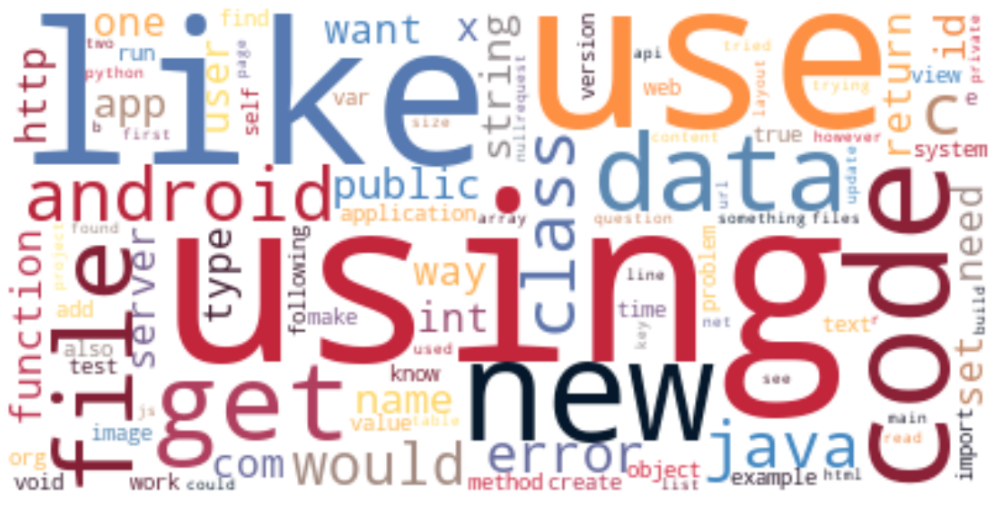

In [19]:
hero.wordcloud(data['Texte'], max_words=100, background_color='WHITE')

Plutôt que faire un *bag-of-words* nous allons faire un **tf-idf**, qui pondèrent les mots en fonction de leur fréquence dans le document mais aussi dans le corpus tout entier.

In [20]:
import warnings
#On enlève un message d'erreur peu pertinent
warnings.filterwarnings("ignore", category=DeprecationWarning) 

#On fait le tf-idf
(tf, features) = hero.tfidf(data['Texte'], max_features=100, return_feature_names=True)
tf_df = pd.DataFrame(tf.tolist(), columns = features)
data['tf-idf'] = tf
data[["tf-idf", "Texte"]].head()

D:\Anaconda\envs\IML\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.



,tf-idf,Texte
0,"[0.0, 0.11152896799228124, 0.0, 0.0, 0.0, 0.0,...",mercator longitude latitude calculations x ...
1,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.433...",starting point learning cad cae file formats ...
2,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",linq query datatablei trying perform linq...
3,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",overload std swap std swap used many std ...
4,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",get directory listing c scan director...


In [21]:
#On fait un t-SNE avec Texthero
data['tsne'] = hero.tsne(data['tf-idf'])
hero.scatterplot(data, col='tsne', title="t-SNE")

## Détection de sujet par K-means

On va utiliser l'algorithme **K-means** pour séparer les documents en clusters de sujets. Il nous faut d'abord sélectionner le bon nombre de clusters, on utilisera pour cela la méthode du coude appliquée au coefficient de **distorsion** du clustering obtenu. **Yellowbricks** offre plusieurs options d'optimisation et de visualisation pour cela.

In [22]:
from sklearn import preprocessing

#On standardise les données d'intérêt pour nos modèles de clustering
X_norm = preprocessing.scale(tf_df)

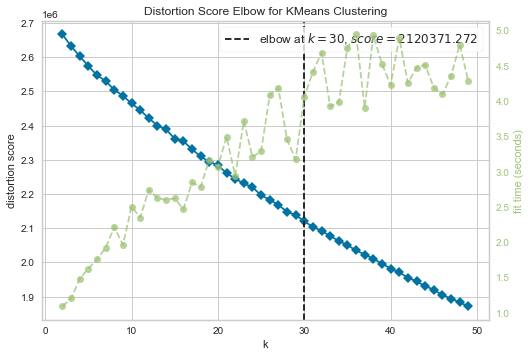

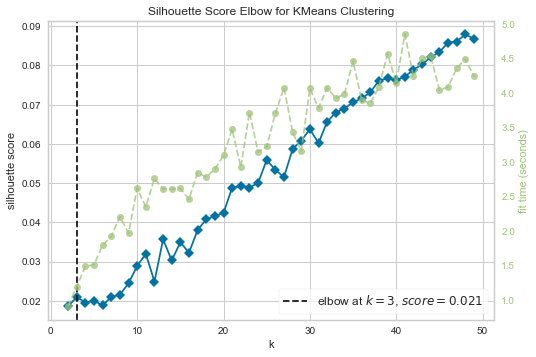

<AxesSubplot:title={'center':'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [23]:
from sklearn import cluster
from yellowbrick.cluster import KElbowVisualizer

#On va utiliser KElbowVisualizer pour sélectionner k selon la méthode du coude pour le coefficient de distorsion
model = cluster.KMeans(random_state=42)
visualizer = KElbowVisualizer(model, k=(2,50), metric="distortion")
#On applique le sélecteur en le chronométrant
start_time = timeit.default_timer()
visualizer.fit(X_norm)
elapsed_optim = timeit.default_timer() - start_time
#On récupère la valeur de k optimale selon ce nouveau critère de sélection
N_clusters = visualizer.elbow_value_
visualizer.poof()
#On affiche également le coefficient de silhouette en fonction du nombre de clusters
visualizer = KElbowVisualizer(model, k=(2,50), metric="silhouette")
visualizer.fit(X_norm)
visualizer.poof()

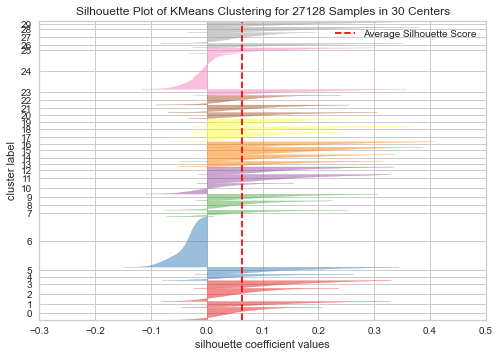

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 27128 Samples in 30 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [24]:
from yellowbrick.cluster import SilhouetteVisualizer

#On va visualiser le coefficient de silhouette de chaque individu, avec la valeur de k sélectionnée
model_precis = cluster.KMeans(N_clusters, random_state=42)
visualizer = SilhouetteVisualizer(model_precis)
visualizer.fit(X_norm) 
visualizer.poof() 

Affichons notre clustering, avec le nombre de clusters idéal pour le coefficient de distorsion. Texthero nous fournit une fonction pour réaliser notre K-means une fois que nous avons choisi la valeur de K.

In [25]:
#On fait notre k-means en le chronométrant
start_time = timeit.default_timer()
data["k-means"] = hero.representation.kmeans(data["tf-idf"], n_clusters=N_clusters, init='k-means++',
                                             random_state=42, n_jobs=- 1,precompute_distances='auto')
elapsed_final = timeit.default_timer() - start_time
#Avant de le visualiser sur notre t-SNE
hero.scatterplot(data, col='tsne', color="k-means", title="t-SNE")
print("Temps écoulé : {:.2f}s pour sélectionner le nombre de clusters, {:.2f}s pour le modèle final"\
      .format(elapsed_optim, elapsed_final))

Temps écoulé : 165.06s pour sélectionner le nombre de clusters, 3.23s pour le modèle final


Maintenant que nous avons séparé les textes en groupes similaires, il nous faut identifier les sujets sur lesquels portent les textes d'un cluster. Pour cela, nous allons extraire les $10$ mots les plus importants (au sens de la pondération *tf-idf*) pour chaque cluster.

In [26]:
#On crée un dataframe contenant la somme des poids TF-IDF au sein de chaque cluster
tf_df["cluster"] = data["k-means"]
tf_df_sum = tf_df.groupby("cluster")[features].apply(sum)
print(tf_df_sum.shape)
tf_df_sum.head()

(30, 100)


,add,also,android,api,app,application,array,b,build,c,...,var,version,view,void,want,way,web,work,would,x
cluster,,,,,,,,,,,,,,,,,,,,,
0,26.487849,21.571665,5.378467,4.515548,32.576635,16.755408,4.262319,11.276008,3.524669,8.052993,...,20.306872,2.909934,349.651828,34.161194,34.361607,28.982882,5.327390,23.368518,26.222584,15.948612
1,15.626778,41.548085,6.523279,20.842581,18.801737,33.448958,2.328684,4.798308,20.957461,19.307579,...,3.782837,19.245552,7.694711,6.112831,67.471593,50.539753,24.679800,34.282514,61.943200,5.929188
2,23.125385,27.219135,8.250861,79.189277,29.194455,43.781455,2.910205,5.558897,16.731378,16.581422,...,24.206850,27.944081,9.887294,9.990448,40.424965,39.764993,53.865404,35.681467,37.502262,23.525856
3,13.098748,11.086970,3.765773,4.584234,4.654192,5.523946,5.301289,12.552899,2.814306,17.645117,...,4.582851,4.004060,7.015716,2.417054,24.456005,28.827026,4.522398,10.203028,26.641419,18.639153
4,13.365246,10.180945,2.640095,12.037681,7.928640,6.183568,11.642892,9.408907,2.499718,9.900044,...,17.981130,6.746957,6.440221,3.831491,19.242808,15.611854,4.353080,16.328277,15.244693,6.228015


In [27]:
#Cette fonction va trier le panda.series en entrée, avant de renvoyer les n features les plus importantes
def mots_importants_clusters(data, features, n):
    df = pd.DataFrame(data)
    df.sort_values(by = df.columns[0], axis = 0, ascending = False, inplace = True)
    return df.index[:n]

#On va lister les 10 mots les plus importants pour chaque cluster
num_words = 10
tf_df_sum["liste"] = tf_df_sum.apply(lambda x : mots_importants_clusters(x, features, num_words).tolist(), axis = 1)

In [28]:
#On affiche les résultats
for i in tf_df_sum.index:
    print("cluster n°{} : ".format(i), tf_df_sum.loc[i, "liste"])

cluster n°0 :  ['view', 'self', 'code', 'using', 'like', 'want', 'void', 'get', 'app', 'return']
cluster n°1 :  ['use', 'using', 'one', 'want', 'would', 'need', 'like', 'know', 'used', 'code']
cluster n°2 :  ['http', 'com', 'request', 'url', 'api', 'org', 'using', 'get', 'html', 'example']
cluster n°3 :  ['list', 'like', 'using', 'way', 'get', 'would', 'want', 'python', 'one', 'use']
cluster n°4 :  ['id', 'name', 'table', 'value', 'type', 'data', 'like', 'class', 'get', 'using']
cluster n°5 :  ['function', 'var', 'return', 'code', 'using', 'js', 'use', 'like', 'get', 'example']
cluster n°6 :  ['public', 'class', 'new', 'private', 'void', 'string', 'return', 'get', 'set', 'name']
cluster n°7 :  ['android', 'layout', 'com', 'app', 'build', 'java', 'using', 'new', 'id', 'use']
cluster n°8 :  ['file', 'files', 'using', 'line', 'want', 'like', 'way', 'read', 'use', 'get']
cluster n°9 :  ['c', 'b', 'code', 'using', 'use', 'like', 'would', 'way', 'know', 'get']
cluster n°10 :  ['string', 'ret

On peut identifier dans l'ordre les sujets suivants : 0 - "code", 1 - "stopwords", 2 - "développement web", 3 - "python", 4 - "base de données", 5 - "javascript", 6 - "c++", 7 - "android", 8 - "fichiers", 9 - "langage c", 10 - "langage c", 11 - "code", 12 - "orienté objet", 13 - "image", 14 - "java", 15 - "développement web", 16 - "python", 17 - "array", 18 - "stopwords", 19 - "orienté objet", 20 - "base de données", 21 - "temps et dates", 22 - "serveur", 23 - "langage c", 24 - "application", 25 - "debugging", 26 - "données", 27 - "mathématiques", 28 - "texte", 29 - "utilisateur".

# Changement de métrique

L'algorithme K-means est trés ensible au choix de la métrique. Nous allons tâche de le mettre en place avec une métrique récemment développée appellée **view-distance**, qui somme les distances entre les projections sur chaque plan généré par une paire de vecteurs de la base canonique. On utilisera l'algorithme K-means implémenté dans **NLTK**, car il nous autorise à changer la métrique utilisée.

In [29]:
#On met en place la fonction de distance entre 2 points
def view_distance(a, b):
    m = len(a)
    dist = 0
    for i in range(m-1):
        for j in range(i+1,m):
            proj = np.sqrt((a[i]-b[i])**2 + (a[j]-b[j])**2)
            dist = dist + proj
    return dist

Les auteurs de la view-distance soulevaient le risque d'un temps d'éxécution particulièrement élevé pour cette nouvelle version de l'algorithme K-means. On commencera donc par lancer l'algorithme sur une version réduite de la base de données, pour estimer le temps total requis

In [30]:
from nltk.cluster.kmeans import KMeansClusterer
import numpy as np

#On réduit la taille de la base de données à 1% des entrées
N_split = int(0.01*X_norm.shape[0])
split = data.iloc[:N_split]

#On va faire le K-means avec la métrique euclidienne, en chronométrant le temps de calcul pour référence
start_time = timeit.default_timer()
split['classique'] = hero.representation.kmeans(split["tf-idf"], n_clusters=N_clusters, init='k-means++',
                                             random_state=42, n_jobs=- 1,precompute_distances='auto')
elapsed_eucl = timeit.default_timer() - start_time

#On va faire le K-means avec la view-distance, en chronométrant le temps de calcul pour comparer
kclusterer = KMeansClusterer(N_clusters, distance=view_distance)
start_time = timeit.default_timer()
split['view'] = kclusterer.cluster(X_norm[:N_split], assign_clusters=True)
elapsed_view = timeit.default_timer() - start_time

C:\Users\monte\AppData\Local\Temp\ipykernel_11196\3267874964.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\monte\AppData\Local\Temp\ipykernel_11196\3267874964.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [31]:
#On affiche les résultats via le t-SNE
print("Temps écoulé pour {} documents : {:.2f}s pour le K-means classique, {:.2f}s avec la view distance".format(N_split, elapsed_eucl, elapsed_view))
hero.scatterplot(split, col='tsne', title="t-SNE", color='classique')
hero.scatterplot(split, col='tsne', title="t-SNE", color='view')

Temps écoulé pour 271 documents : 2.45s pour le K-means classique, 1037.97s avec la view distance


FLAG Interprétation temps trop long.

# Top2Vec

Le package Top2Vec permet de manipuler rapidement l'algorithme du même nom, qui détecte les sujets dans les documents en les vectorisant avec un word embedding (par exemple l'**USE**), en réduisant les dimensions des données (via **UMAP**), en effectuant un clustering des résultats obtenus (par défaut à l'aide d'un **HDBSCAN**) puis en affichant les mots les plus proches des centroïdes des clusters, ces derniers correspondant aux plongements des sujets détectés.

In [32]:
import tqdm
from top2vec import Top2Vec

#On lance l'algorithme Top2Vec avec le vectorizer USE
model = Top2Vec(data['Texte'].values, embedding_model='universal-sentence-encoder')

D:\Anaconda\envs\IML\lib\site-packages\tqdm\auto.py:22: TqdmWarning:

IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html



ImportError: universal-sentence-encoder is not available.

Try: pip install top2vec[sentence_encoders]

Alternatively try: pip install tensorflow tensorflow_hub tensorflow_text

Il semblerait que le package Top2Vec ne soit pas à jour. Malgré nos efforts nous n'avons pas réussi à le rendre compatible avec les versions actuelles de tensorflow, et il ne peut donc pas charger l'Universal Sentence Encoder. Nous allons tâcher de le faire fonctionner avec le word embedding par défaut, en reprenant une ligne de commande fonctionnant pour un autre utilisateur.

In [33]:
model = Top2Vec(documents=data['Texte'].values, speed="learn", workers=3)

2022-06-29 09:28:23,870 - top2vec - INFO - Pre-processing documents for training
2022-06-29 09:28:32,547 - top2vec - INFO - Creating joint document/word embedding


AttributeError: 'list' object has no attribute 'keys'

Il semblerait qu'il y ait d'autres soucis de compatibilité. Malgré plusieurs essais infructueux (incluant de modifier manuellement les fichiers du package) et l'absence de réponse pertinente sur internet, nous sommes contraints d'abandonner cette approche au vu de la deadline imminente.